In [1]:
using FurutaPendulums
using AlphaZero
using Plots

In [2]:
ϕdotmax = 20.
nϕdot = 100
θdotmax = 50.
nθdot = 100
nθ = 90
nu = 3
umax = 1.

function discrete_state(x)
    ϕ, ϕdot, θ, θdot = x
    ϕdot = clamp(ϕdot, -ϕdotmax, ϕdotmax)
    θdot = clamp(θdot, -θdotmax, θdotmax)
    i1 = round(Int,(ϕdotmax+ϕdot)/ϕdotmax/2*nϕdot)
    i2 = round(Int,(θ+pi)/pi/2*nθ)
    i3 = round(Int,(θdotmax+θdot)/θdotmax/2*nθdot)
    ϕdot = i1/nϕdot*2*ϕdotmax-ϕdotmax
    θ = i2/nθ*2pi-pi
    θdot = i3/nθdot*2*θdotmax-θdotmax
    return [0.,ϕdot,θ,θdot]
end
function state2int(x)
    ϕ, ϕdot, θ, θdot = x
    ϕdot = clamp(ϕdot, -ϕdotmax, ϕdotmax)
    θdot = clamp(θdot, -θdotmax, θdotmax)
    i1 = round(Int,(ϕdotmax+ϕdot)/ϕdotmax/2*nϕdot)
    i2 = round(Int,(θ+pi)/pi/2*nθ)
    i3 = round(Int,(θdotmax+θdot)/θdotmax/2*nθdot)
    return i1+ i2*nϕdot + i3*nϕdot*nθ
end
function int2state(n)
    i3 = n ÷ (nϕdot*nθ)
    i2 = (n-i3*nϕdot*nθ) ÷ nϕdot
    i1 = n-i2*nϕdot-i3*nϕdot*nθ
    ϕdot = i1/nϕdot*2*ϕdotmax-ϕdotmax
    θ = i2/nθ*2pi-pi
    θdot = i3/nθdot*2*θdotmax-θdotmax
    return [0.,ϕdot,θ,θdot]
end

n = state2int([0,-4,-pi+0.001,-4])
int2state(n)
discrete_state([0,-40,pi-0.255,-40])

4-element Vector{Float64}:
   0.0
 -20.0
   2.862339973270701
 -40.0

In [3]:
struct GameSpec <: GI.AbstractGameSpec
    dt
end

GameSpec() = GameSpec(0.02)

mutable struct PendulumEnv <: GI.AbstractGameEnv
    furuta::SimulatedFurutaPendulum
    state
    t
end

function GI.init(::GameSpec)
    furuta = SimulatedFurutaPendulum()
    state = discrete_state([0.,0.,pi,0.])
    PendulumEnv(furuta,state,0.)
end

GI.spec(::PendulumEnv) = GameSpec()
GI.two_players(::GameSpec) = false
GI.white_playing(::PendulumEnv) = true
GI.actions(::GameSpec) = collect(-umax:2umax/(nu-1):umax)
GI.vectorize_state(::GameSpec,state) = Float32.(state)
GI.current_state(p::PendulumEnv) = p.state
GI.actions_mask(p::PendulumEnv) = ones(Bool,length(GI.actions(GI.spec(p))))*~GI.game_terminated(p)

function GI.game_terminated(p::PendulumEnv)
    # ϕ, ϕdot, θ, θdot = p.state
    # return abs(ϕdot)<0.1 && abs(θ)<0.1 && abs(θ)<0.1
    p.t > 5.
end

function GI.white_reward(p::PendulumEnv)
    ϕ, ϕdot, θ, θdot = p.state
    costs = abs(0.0018522 - 0.0018522 * cos(θ) - 0.00000387 * θdot^2 + 0.0000652*ϕdot^2*(cos(θ)<0.8))/0.0018522
    return -costs
end
function GI.set_state!(g::PendulumEnv, state)
  g.state = state
end

function GI.play!(g::PendulumEnv, u)
    g.furuta.x[2:4] = g.state[2:4]
    control(g.furuta,u)
    dt = GI.spec(g).dt
    periodic_wait(g.furuta,0.,dt)
    g.t += dt
    g.state = discrete_state(g.furuta.x)
end
GI.heuristic_value(::PendulumEnv) = 0.

penv = GI.init(GameSpec())
@show GI.play!(penv,0.)
@show GI.white_playing(penv)
@show GI.white_reward(penv)
@show GI.game_terminated(penv)
@show GI.actions(GI.spec(penv))
@show GI.current_state(penv)
@show GI.actions_mask(penv)

for i=1:250
    GI.play!(penv,0.)
end
@show GI.game_terminated(penv)
@show penv.t
;

GI.play!(penv, 0.0) = [0.0, 0.0, 3.141592653589793, 0.0]
GI.white_playing(penv) = true
GI.white_reward(penv) = -2.0
GI.game_terminated(penv) = false
GI.actions(GI.spec(penv)) = [-1.0, 0.0, 1.0]
GI.current_state(penv) = [0.0, 0.0, 3.141592653589793, 0.0]
GI.actions_mask(penv) = Bool[1, 1, 1]
GI.game_terminated(penv) = true
penv.t = 5.019999999999981


In [4]:
@show penv.state
GI.play!(penv,0.)
@show penv.state
;

penv.state = [0.0, 0.0, 3.141592653589793, 0.0]
penv.state = [0.0, 0.0, 3.141592653589793, 0.0]


In [5]:
discrete_state([0.0, 9.600000000000001, 2.9321531433504733, 10.0])

4-element Vector{Float64}:
  0.0
  9.600000000000001
  2.9321531433504733
 10.0

In [8]:
# AlphaZero.Scripts.test_game(GameSpec())

[ Info: There appears to be a unique initial state.


LoadError: MethodError: no method matching action_string(::GameSpec, ::Float64)
[0mClosest candidates are:
[0m  action_string([91m::AlphaZero.CommonRLInterfaceWrapper.Spec[39m, ::Any) at ~/.julia/environments/v1.8/dev/AlphaZero/src/common_rl_intf.jl:172
[0m  action_string([91m::AlphaZero.Examples.Tictactoe.GameSpec[39m, ::Any) at ~/.julia/environments/v1.8/dev/AlphaZero/games/tictactoe/game.jl:174
[0m  action_string([91m::AlphaZero.Examples.ConnectFour.GameSpec[39m, ::Any) at ~/.julia/environments/v1.8/dev/AlphaZero/games/connect-four/game.jl:263
[0m  ...

In [6]:
using Flux.Optimise
using Dates

Network = NetLib.SimpleNet

netparams = NetLib.SimpleNetHP(
  width=100,
  depth_common=2,
  use_batch_norm=false)

self_play = SelfPlayParams(
  sim=SimParams(
    num_games=64,
    num_workers=12,
    batch_size=12,
    use_gpu=false,
    reset_every=16,
    flip_probability=0.,
    alternate_colors=false),
  mcts=MctsParams(
    num_iters_per_turn=50,
    cpuct=1.0,
    temperature=ConstSchedule(0.),
    dirichlet_noise_ϵ=0.,
    dirichlet_noise_α=1.))

arena = ArenaParams(
  sim=SimParams(
    num_games=10,
    num_workers=10,
    batch_size=10,
    use_gpu=false,
    reset_every=1,
    flip_probability=0.,
    alternate_colors=true),
  mcts = self_play.mcts,
  update_threshold=-1e10)

learning = LearningParams(
  use_gpu=false,
  use_position_averaging=false,
  samples_weighing_policy=CONSTANT_WEIGHT,
  rewards_renormalization=10,
  l2_regularization=1e-4,
  # optimiser=Adam(lr=5e-3),
  optimiser=CyclicNesterov(lr_base=5e-3,lr_high=1e-2,lr_low=1e-3,momentum_low=0.5,momentum_high=0.9),
  batch_size=64,
  loss_computation_batch_size=2048,
  nonvalidity_penalty=1.,
  min_checkpoints_per_epoch=1,
  max_batches_per_checkpoint=5_000,
  num_checkpoints=1)

my_params = Params(
  arena=arena,
  self_play=self_play,
  learning=learning,
  num_iters=10,
  memory_analysis=nothing,
  ternary_outcome=false,
  # ternary_rewards=false,
  use_symmetries=false,
  mem_buffer_size=PLSchedule(100_000))

benchmark_sim = SimParams(
  arena.sim;
  num_games=10,
  num_workers=4,
  batch_size=4)

benchmark = [
  Benchmark.Single(
    Benchmark.Full(self_play.mcts),
    benchmark_sim),
  Benchmark.Single(
    Benchmark.NetworkOnly(),
    benchmark_sim)]

experiment = Experiment(
  "Pendulum-$(now())", GameSpec(), my_params, Network, netparams, benchmark)

Experiment("Pendulum-2023-05-18T13:52:27.831", GameSpec(0.02), Params(SelfPlayParams(MctsParams(1.0, 1.0, 50, ConstSchedule{Float64}(0.0), 0.0, 1.0, 1.0), SimParams(64, 12, 12, false, true, 16, 0.0, false)), nothing, LearningParams(false, false, CONSTANT_WEIGHT, CyclicNesterov(0.005f0, 0.01f0, 0.001f0, 0.5f0, 0.9f0), 0.0001f0, 10.0f0, 1.0f0, 64, 2048, 1, 5000, 1), ArenaParams(MctsParams(1.0, 1.0, 50, ConstSchedule{Float64}(0.0), 0.0, 1.0, 1.0), SimParams(10, 10, 10, false, true, 1, 0.0, true), -1.0e10), 5, false, false, PLSchedule{Int64}([0], [100000])), SimpleNet, SimpleNetHP(100, 2, 1, 1, false, 0.6f0), AlphaZero.Benchmark.Single[AlphaZero.Benchmark.Single(AlphaZero.Benchmark.Full(MctsParams(1.0, 1.0, 50, ConstSchedule{Float64}(0.0), 0.0, 1.0, 1.0)), SimParams(10, 4, 4, false, true, 1, 0.0, true)), AlphaZero.Benchmark.Single(AlphaZero.Benchmark.NetworkOnly(1.0), SimParams(10, 4, 4, false, true, 1, 0.0, true))])

In [9]:
Scripts.dummy_run(experiment)


Initializing a new AlphaZero environment

  Initial report
  
    Number of network parameters: 41,304
    Number of regularized network parameters: 40,800
    Memory footprint per MCTS node: 288 bytes
  
  Running benchmark: AlphaZero
  
    
    Average reward: -1282.80, redundancy: 43.7%
  
  Running benchmark: Network Only
  
    
    Average reward: -1063.65, redundancy: 8.3%


┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-elemen


Starting iteration 1

  Starting self-play
  
    
    Generating 141 samples per second on average
    Average exploration depth: 3.2
    MCTS memory footprint per worker: 144.29kB
    Experience buffer size: 251 (142 distinct boards)
  
  Starting learning
  
    Optimizing the loss
    
         Loss       Lv       Lp     Lreg     Linv       Hp    Hpnet
      5565.035564.7983   0.1997   0.0417   0.0000   0.7150   1.0157
      5558.625558.4170   0.1658   0.0417   0.0000   0.7150   0.9579
    
    Launching a checkpoint evaluation
    
      
      Average reward: +0.00 (network replaced), redundancy: 43.7%
  
  Running benchmark: AlphaZero
  
    
    Average reward: -1282.80, redundancy: 43.7%
  
  Running benchmark: Network Only
  
    
    Average reward: -1033.81, redundancy: 2.4%

Starting iteration 2

  Starting self-play
  


┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-elemen

    
    Generating 1,247 samples per second on average
    Average exploration depth: 3.2
    MCTS memory footprint per worker: 144.29kB
    Experience buffer size: 502 (142 distinct boards)
  
  Starting learning
  
    Optimizing the loss
    
         Loss       Lv       Lp     Lreg     Linv       Hp    Hpnet
      5558.625558.4155   0.1660   0.0417   0.0000   0.7149   0.9579
      5558.605558.4077   0.1556   0.0417   0.0000   0.7149   0.9157
    
    Launching a checkpoint evaluation
    
      
      Average reward: +0.00 (network replaced), redundancy: 43.7%
  
  Running benchmark: AlphaZero
  
    
    Average reward: -1282.80, redundancy: 43.7%
  
  Running benchmark: Network Only
  
    
    Average reward: -1048.37, redundancy: 1.6%

Training completed



┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-elemen

In [ ]:
Scripts.train(experiment)


Initializing a new AlphaZero environment

  Initial report
  
    Number of network parameters: 41,304
    Number of regularized network parameters: 40,800
    Memory footprint per MCTS node: 288 bytes
  
  Running benchmark: AlphaZero
  
    Progress: 100%|█████████████████████████████████████| Time: 0:02:04
    
    Average reward: -244.95, redundancy: 93.6%
  
  Running benchmark: Network Only
  
    Progress: 100%|█████████████████████████████████████| Time: 0:00:00
    
    Average reward: -1049.17, redundancy: 22.9%


┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots ~/.julia/packages/Plots/p3KMq/src/axes.jl:642
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-elemen


Starting iteration 1

  Starting self-play
  
    Progress:  78%|████████████████████████████▉        |  ETA: 0:04:25

In [27]:
s = Session(experiment)
AZplayer = AlphaZeroPlayer(s)
Netplayer = NetworkPlayer(s.env.bestnn);

# LightAZplayer = MctsPlayer(
    # GameSpec(),
    # s.env.bestnn,
    # MctsParams(
    #     num_iters_per_turn=10,
    #     cpuct=1.0,
    #     temperature=ConstSchedule(0.),
    #     dirichlet_noise_ϵ=0.,
    #     dirichlet_noise_α=1.))


Loading environment from: sessions/Pendulum-2023-05-18T13:52:27.831



MctsPlayer{AlphaZero.MCTS.Env{Vector{Float64}, SimpleNet}}(AlphaZero.MCTS.Env{Vector{Float64}, SimpleNet}(Dict{Vector{Float64}, AlphaZero.MCTS.StateInfo}(), SimpleNet(GameSpec(0.02), SimpleNetHP(100, 2, 1, 1, false, 0.6f0), Chain(flatten, Dense(4, 100, relu), Dense(100, 100, relu), Dense(100, 100, relu)), Chain(Dense(100, 100, relu), Dense(100, 1, tanh)), Chain(Dense(100, 100, relu), Dense(100, 3), softmax)), 1.0, 1.0, 0.0, 1.0, 1.0, 0, 0, GameSpec(0.1)), 10, nothing, ConstSchedule{Float64}(0.0))

In [36]:

# 1 iteration
s = Session(experiment,dir="sessions/Pendulum-2023-05-17T13:32:40.123")
AZplayer = AlphaZeroPlayer(s)
Netplayer = NetworkPlayer(s.env.bestnn)


Loading environment from: sessions/Pendulum-2023-05-17T13:32:40.123



[ Info: Using modified parameters


NetworkPlayer{SimpleNet}(SimpleNet(GameSpec(0.02), SimpleNetHP(100, 2, 1, 1, false, 0.6f0), Chain(flatten, Dense(4, 100, relu), Dense(100, 100, relu), Dense(100, 100, relu)), Chain(Dense(100, 100, relu), Dense(100, 1, tanh)), Chain(Dense(100, 100, relu), Dense(100, 3), softmax)))

In [49]:
s = Session(experiment,dir="sessions/Pendulum-2023-05-17T15:38:32.121")
AZplayer = AlphaZeroPlayer(s)
Netplayer = NetworkPlayer(s.env.bestnn)


Loading environment from: sessions/Pendulum-2023-05-17T15:38:32.121



NetworkPlayer{SimpleNet}(SimpleNet(GameSpec(0.02), SimpleNetHP(100, 2, 1, 1, false, 0.6f0), Chain(flatten, Dense(4, 100, relu), Dense(100, 100, relu), Dense(100, 100, relu)), Chain(Dense(100, 100, relu), Dense(100, 1, tanh)), Chain(Dense(100, 100, relu), Dense(100, 3), softmax)))

In [35]:
fieldnames(typeof(s.env))

(:gspec, :params, :curnn, :bestnn, :memory, :itc)

In [29]:
dt = 0.02
game = GI.init(GameSpec(dt),)

furuta = SimulatedFurutaPendulum()
tmax = 5.
tspan = 0.:dt:tmax
furuta.x = [0,0,pi,0]
xs = zeros(length(tspan),4)
@show game.state
for (i,t) in enumerate(tspan)
    xs[i,:] = furuta.x
    state_copy = game.state[:]
    u = select_move(AZplayer,game,1)
    # u = select_move(Netplayer,game,1)
    game.state = state_copy
    GI.play!(game,u)
    # @show (u => game.state)
    control(furuta,u)
    periodic_wait(furuta,0.,dt)
    furuta.x[2:4] = discrete_state(furuta.x)[2:4]
end
# plot(tspan,xs,label=[ "ϕ" "dϕ" "θ" "dθ"])
animate_pendulum(xs[:,1],xs[:,3],tmax)

game.state = [0.0, 0.0, 3.141592653589793, 0.0]


LoadError: ArgumentError: step cannot be zero

# AlphaZero balancing a pendulum

(but it takes forever (~1sec) to make a decision, so it's not really useful)

Also the simulation is unrealistic: We are using the simulated DISCRETE environment. This means that at each time step, the simulated state (for example theta = 0.018283) is replaced by the closest discretization bin (e.g. theta = 0.02). 

game.state = [0.0, 0.0, 3.141592653589793, 0.0]


[ Info: Saved animation to /home/.disk/merged/fay-04.control.lth.se/export/home/data/jyjh/group-2/src/anim_pendulum.gif


Plots.AnimatedGif("/home/.disk/merged/fay-04.control.lth.se/export/home/data/jyjh/group-2/src/anim_pendulum.gif")
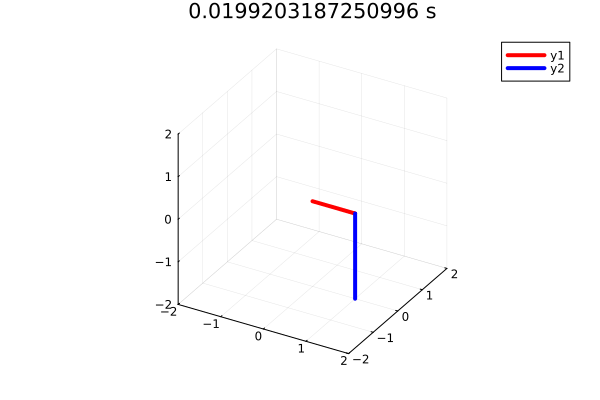

In [16]:
animate_pendulum(xs[:,1],xs[:,3],tmax)

# Same but using network only (no MCTS)

This is not very good, the model eventually swings up but fails to balance

game.state = [0.0, 0.0, 3.141592653589793, 0.0]


[ Info: Saved animation to /home/.disk/merged/fay-04.control.lth.se/export/home/data/jyjh/group-2/src/anim_pendulum.gif


Plots.AnimatedGif("/home/.disk/merged/fay-04.control.lth.se/export/home/data/jyjh/group-2/src/anim_pendulum.gif")
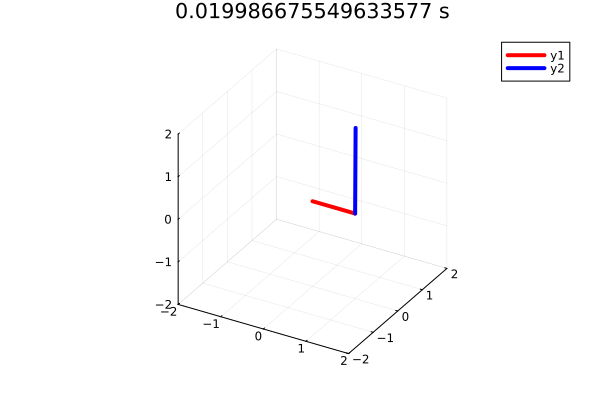

In [23]:
include("sim/env.jl")
game = GI.init(GameSpec(),)

furuta = SimulatedFurutaPendulum()
dt = 0.02
tmax = 30.
tspan = 0.:dt:tmax
furuta.x = [0,0,0.01,0]
xs = zeros(length(tspan),4)
@show game.state
for (i,t) in enumerate(tspan)
    xs[i,:] = furuta.x
    state_copy = game.state[:]
    # u = select_move(AZplayer,game,1)
    u = select_move(Netplayer,game,1)
    game.state = state_copy
    GI.play!(game,u)
    game.t = 0. # allow more than 5 sec.
    # @show (u => game.state)
    control(furuta,u)
    periodic_wait(furuta,0.,dt)
    furuta.x[2:4] = discrete_state(furuta.x)[2:4]
end
plot(tspan,xs,label=[ "ϕ" "dϕ" "θ" "dθ"])
animate_pendulum(xs[:,1],xs[:,3],tmax)



# Results Summary

Here is a commentary on the first results of the AlphaZero training:

The algorithm takes a lot of time to train (~30mins for 64 episodes)

Some big differences between using it for a board game and using it for a pendulum:
* One player only
    * This is handled natively by the library
    
* No terminal state
    * Instead, I set a time limit of t=5s. but it is not handled perfectly. I'm still not sure of what it is doing exactly.
    
* Reward every step instead of at the end of a game
    * Also handled natively
    
* Need to get really quick response time.
    * If I use the MC Tree Search, the algorithm takes 0.5s to compute a single timestep iteration. This is not possible for our case so I ended up relying on the policy network alone (which is much quicker).



[ Info: Saved animation to /home/.disk/merged/fay-04.control.lth.se/export/home/data/jyjh/group-2/src/anim_pendulum.gif


Plots.AnimatedGif("/home/.disk/merged/fay-04.control.lth.se/export/home/data/jyjh/group-2/src/anim_pendulum.gif")
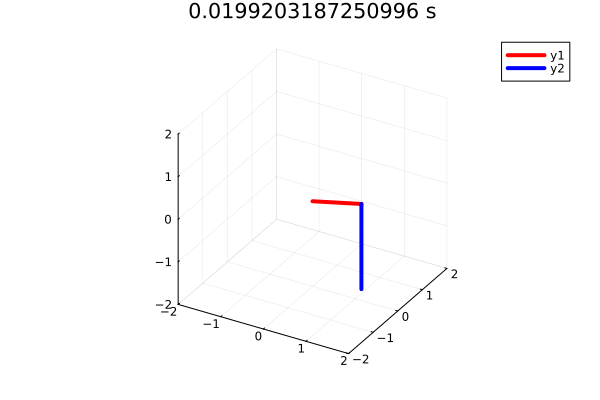

In [41]:
animate_pendulum(xs[:,1],xs[:,3],tmax)

Same policy network but in the CONTINUOUS simulation (no bin centering at each time step)

game.state = [0.0, 0.0, 3.141592653589793, 0.0]


[ Info: Saved animation to /home/.disk/merged/fay-04.control.lth.se/export/home/data/jyjh/group-2/src/anim_pendulum.gif


Plots.AnimatedGif("/home/.disk/merged/fay-04.control.lth.se/export/home/data/jyjh/group-2/src/anim_pendulum.gif")
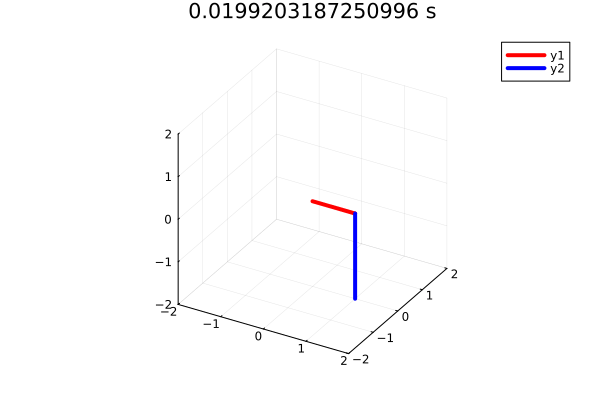

In [44]:
include("sim/env.jl")
game = GI.init(GameSpec(),)

furuta = SimulatedFurutaPendulum()
dt = 0.02
tmax = 5.
tspan = 0.:dt:tmax
# xs = zeros(length(tspan),4)
@show game.state
furuta.x = game.state
for (i,t) in enumerate(tspan)
    xs[i,:] = furuta.x
    state_copy = game.state[:]
    # u = select_move(AZplayer,game,1)
    u = select_move(Netplayer,game,1)
    game.state = state_copy
    GI.play!(game,u)
    # @show (u => game.state)
    control(furuta,u)
    periodic_wait(furuta,0.,dt)
    # furuta.x[2:4] = discrete_state(furuta.x)[2:4] # No centering
end
# plot(tspan,xs,label=[ "ϕ" "dϕ" "θ" "dθ"])
animate_pendulum(xs[:,1],xs[:,3],tmax)



# Testing the game environment with fixed policy

game.state = [0.0, 0.0, 3.141592653589793, 0.0]
u => game.state = 1 => [0.1331173915056678, 9.0, -3.0019663134302466, 9.0]
u => game.state = -1 => [0.056320199293711626, -9.0, -3.07177948351002, -9.0]
u => game.state = -1 => [-0.13319140115319658, -10.0, 3.0019663134302466, -9.0]
u => game.state = -1 => [-0.32865527735202765, -10.0, 2.862339973270701, -8.0]
u => game.state = -1 => [-0.524002268406673, -10.0, 2.7227136331111543, -7.0]
u => game.state = -1 => [-0.7192930676055226, -10.0, 2.5830872929516078, -5.0]
u => game.state = 1 => [-0.6508281240725203, 9.0, 2.7227136331111543, 13.0]
u => game.state = 1 => [-0.4606186846849455, 10.0, 3.0019663134302466, 14.0]
u => game.state = 1 => [-0.2647773346865448, 10.0, -3.0019663134302466, 13.0]
u => game.state = 1 => [-0.06953612329295543, 10.0, -2.722713633111154, 12.0]
u => game.state = 1 => [0.12535222051218353, 10.0, -2.5132741228718345, 10.0]
u => game.state = -1 => [0.05779506143983135, -9.0, -2.5830872929516078, -7.0]
u => game.state =

[ Info: Saved animation to /home/.disk/merged/fay-04.control.lth.se/export/home/data/jyjh/group-2/src/anim_pendulum.gif


Plots.AnimatedGif("/home/.disk/merged/fay-04.control.lth.se/export/home/data/jyjh/group-2/src/anim_pendulum.gif")
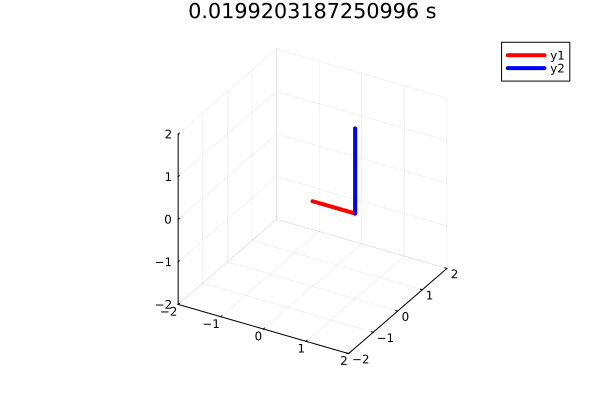

In [11]:
game = GI.init(GameSpec(),)

furuta = SimulatedFurutaPendulum()
dt = 0.02
tmax = 5.
tspan = 0.:dt:tmax
xs = zeros(length(tspan),4)
@show game.state
furuta.x = [0.,0.,0.,0.]
for (i,t) in enumerate(tspan)
    xs[i,:] = furuta.x
    u = (1 - 2*(sin(10π*t)>0.))
    GI.play!(game,u)
    @show (u => game.state)
    control(furuta,u)
    periodic_wait(furuta,0.,dt)
    furuta.x[2:4] = discrete_state(furuta.x)[2:4]
end
# plot(tspan,xs)
animate_pendulum(xs[:,1],xs[:,3],tmax)
